In [1]:
%load_ext autoreload
%autoreload 2

# Notebook demonstrating barcode sequencing and assignment to CellPainting dataset

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from joblib import Parallel, delayed
from cp_posh.registration import transforms, plate_geometry
from cp_posh.utils import data, scaling
from cp_posh.analysis import viz
from cp_posh.sequencing import fcn_base_caller, blob_log_base_caller, sequence_barcodes
from cp_posh.analysis.pipelines import sequence_and_map_barcodes_to_cellpaint_image
pd.options.mode.chained_assignment = None

## Load Datasets

In [ ]:
# !aws s3 cp s3://insitro-research-2023-cellpaint-posh/example_barcoding_datasets/ ./example_datasets/
cellpaint_df = pd.read_parquet("./datasets/sample_dataset/cellpaint.pq")
sbs_dfs = {cycle: pd.read_parquet(f"./datasets/sample_dataset/sbs_{cycle}.pq") for cycle in range(1, 11)}
sgrna_lib = pd.read_parquet("./datasets/sample_dataset/sgRNA_library.pq")

In [4]:
mapped_barcodes, barcodes_all = sequence_and_map_barcodes_to_cellpaint_image(cellpaint_df, sbs_dfs, sgrna_lib)

Creating Well Geometry Objects
Calling Bases for all Cycles


100%|██████████| 12/12 [04:07<00:00, 20.63s/it]


Computing Transforms
Projecting Base Calls to First Cycle and Sequencing Barcodes


100%|██████████| 12/12 [02:11<00:00, 10.96s/it]
[Parallel(n_jobs=16)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=16)]: Done   7 out of  12 | elapsed:   25.1s remaining:   17.9s
[Parallel(n_jobs=16)]: Done  12 out of  12 | elapsed:   27.5s finished


Projecting Barcodes to Cellpaint Space


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [01:44<00:00,  8.73s/it]

Mapping Barcodes to sgRNA Library
Done!


## Visualize SBS and CellPaint Image with Barcodes Projected

In [5]:
# set field of view index to visualize
selected_field_id=  1017

In [6]:
first_cycle_sbs_df = sbs_dfs[1]

In [7]:
# load cellpaint image of the selected field of view index
cellpaint_im = data.read_image(cellpaint_df[cellpaint_df.field_id==selected_field_id].iloc[0].path, image_type="chw")

# load barcodes projected on the selected cellpaint index
barcodes_in_cp_fov = mapped_barcodes[mapped_barcodes.field_id==selected_field_id]

# load one of the SBS first cycle field of views which contains the barcodes projected on to the selected cellpaint field of view
sbs_field_id = barcodes_in_cp_fov.source_field_id.unique()[0]
sbs_im = data.read_image(first_cycle_sbs_df[first_cycle_sbs_df.field_id==sbs_field_id].iloc[0].path, image_type="hwc")

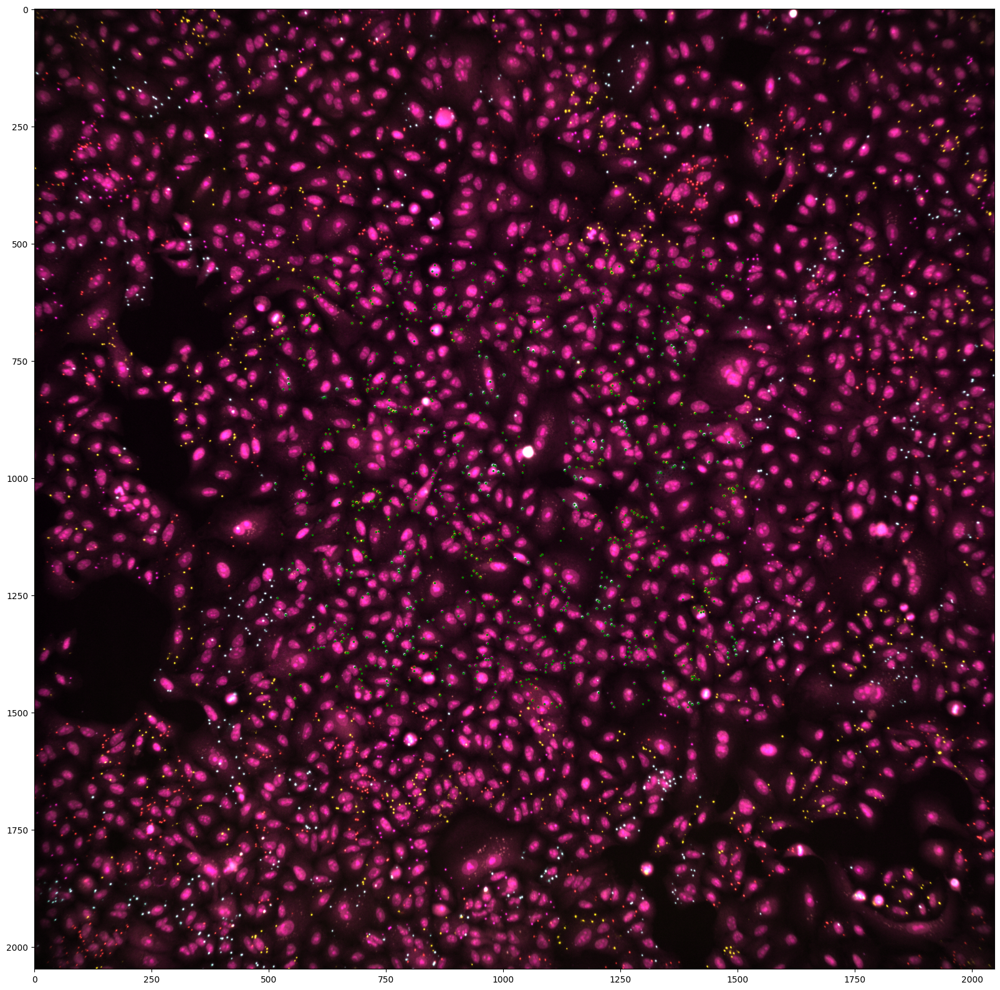

In [8]:
# visualize SBS first cycle image with barcodes corresponding to the selected CellPainting field of view
plt.figure(figsize=(20,20))
plt.imshow(viz.create_composite_image(scaling.rescale_intensity(sbs_im).transpose(1,2,0)))
sbc = barcodes_in_cp_fov[barcodes_in_cp_fov.source_field_id==sbs_field_id]
plt.scatter(sbc.source_x, sbc.source_y, s=2, c='green')

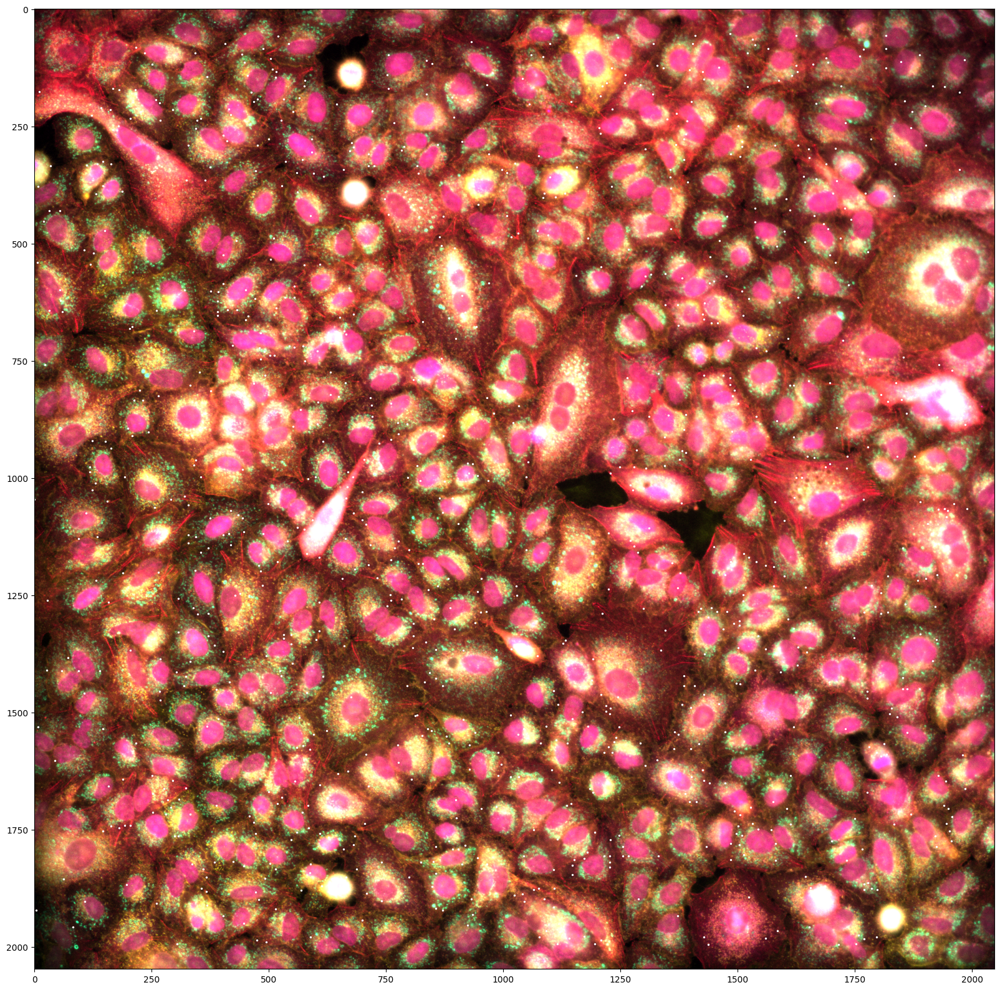

In [9]:
# visualize Cellpaint Image with projected barcodes
plt.figure(figsize=(20,20))
plt.imshow(viz.create_composite_image(scaling.rescale_intensity(cellpaint_im).transpose(1,2,0)))
plt.scatter(barcodes_in_cp_fov.x, barcodes_in_cp_fov.y, s=2, c='white')

In [264]:
# For interactive visualization of projected barcodes (rendering can be very slow)
#viz.interactive_image_scatter_plot(
#    viz.create_composite_image(scaling.rescale_intensity(sbs_im, clip=True).transpose(1,2,0)),
#    np.array(sbc.source_x.values),
#    np.array(sbc.source_y.values),
#    np.array(sbc.gene_id.values)
#)

In [265]:
# For interactive visualization of projected barcodes (rendering can be very slow)
#viz.interactive_image_scatter_plot(
#    viz.create_composite_image(scaling.rescale_intensity(cellpaint_im, clip=True).transpose(1,2,0)),
#    np.array(barcodes_in_cp_fov.x.values),
#    np.array(barcodes_in_cp_fov.y.values),
#    np.array(barcodes_in_cp_fov.gene_id.values)
#)

In [5]:
barcodes_all.to_parquet("./outputs/barcodes_fcn_all.pq")
mapped_barcodes.to_parquet("./outputs/barcodes_fcn_mapped_to_library.pq")